In [11]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os, glob
from moviepy.editor import VideoFileClip

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [9]:
def display_imgs(images, cmap=None):
    cols = 2
    rows = len(images) // 2 + 1
    plt.figure(figsize=(15,12))
    
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    
    plt.tight_layout()
    plt.show()

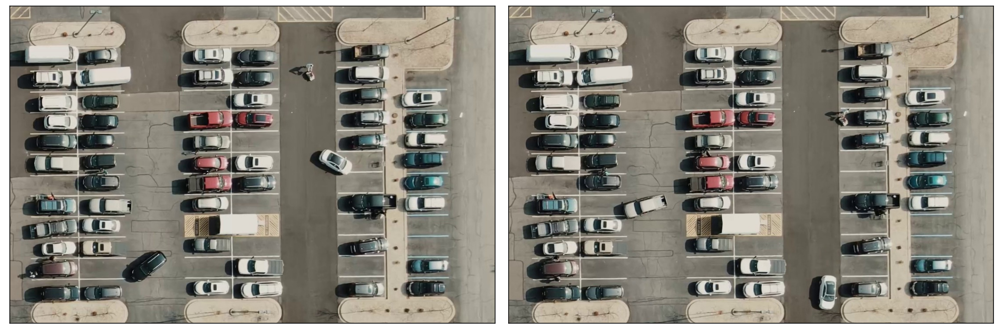

In [12]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]

display_imgs(test_images)

## Frame Masking

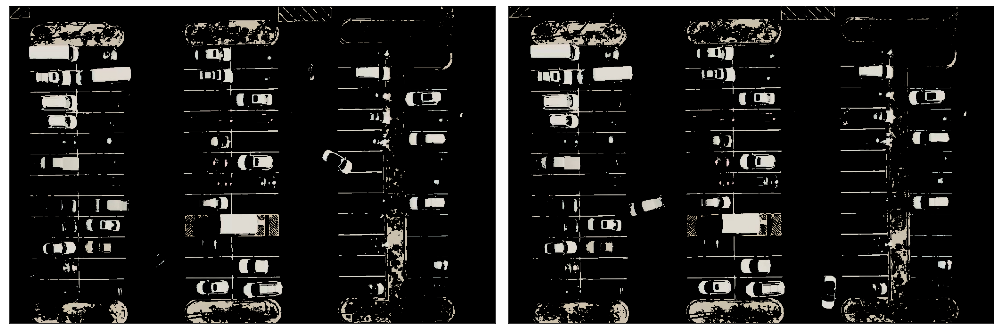

In [74]:
# image is expected be in RGB color space# image 
def image_mask(image): 
    # white color mask
    lower = np.uint8([0, 0, 150])
    upper = np.uint8([30, 255, 255])
    white_mask = cv2.inRange(image, lower, upper)
    # yellow color mask
    lower = np.uint8([190, 190,   0])
    upper = np.uint8([255, 255, 255])
    yellow_mask = cv2.inRange(image, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked = cv2.bitwise_and(image, image, mask = mask)
    return masked

masked_images = list(map(image_mask, test_images))
display_imgs(masked_images)

In [75]:
# import cv2
# vidcap = cv2.VideoCapture('parking_video.mp4')
# success,image = vidcap.read()
# count = 0
# while success:
#   cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file      
#   success,image = vidcap.read()
#   print('Read a new frame: ', success)
#   count += 1

## Grayscaling

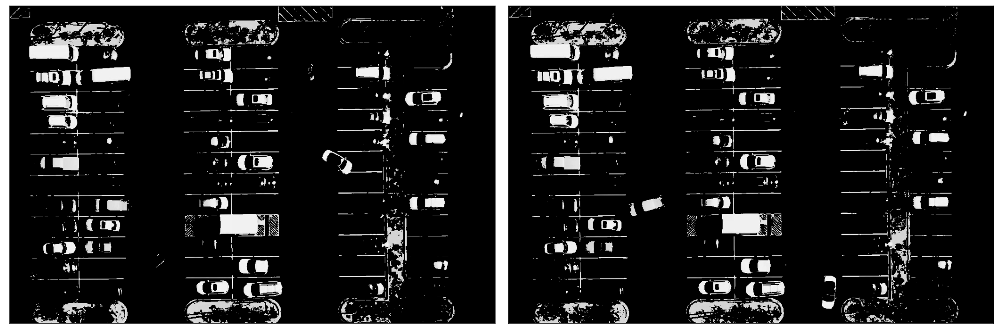

In [76]:
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(convert_gray_scale, masked_images))

display_imgs(gray_images)

## Canny Edge Detection

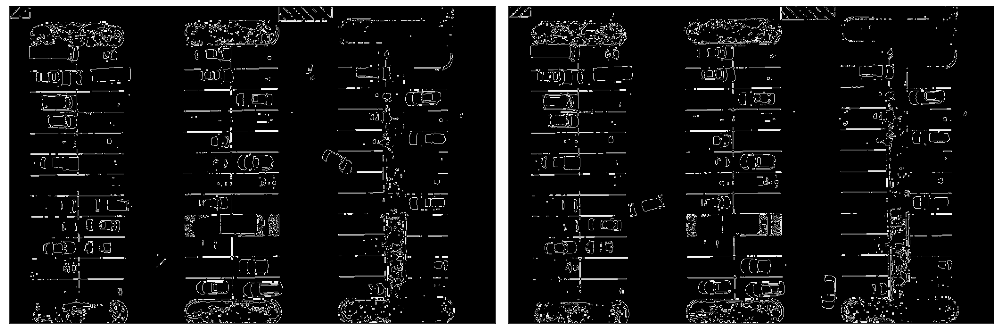

In [77]:
def detect_edges(image):
    return cv2.Canny(image, 50, 150)

edge_images = list(map(detect_edges, gray_images))

display_imgs(edge_images)

## Identify area of interest

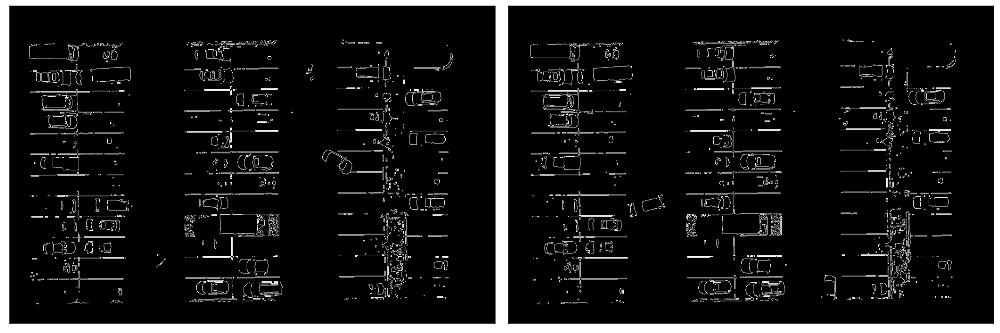

In [78]:
def filter_region(image, vertices):
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) # in case, the input image has a channel dimension        
    return cv2.bitwise_and(image, mask)

    
def select_region(image):
    # first, define the polygon by vertices
    height, width = image.shape[:2]
#     pt_1 = [60, 125]
#     pt_2 = [60, 1010]
#     pt_3 = [1520, 1010]
#     pt_4 = [1520, 125]
    pt_1 = [width*0.04, height*0.12]
    pt_2 = [width*0.04, height*0.94]
    pt_3 = [width*0.93, height*0.92]
    pt_4 = [width*0.92, height*0.10]
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[pt_1, pt_2, pt_3, pt_4]], dtype=np.int32)
    return filter_region(image, vertices)


# images showing the region of interest only
roi_images = list(map(select_region, edge_images))

display_imgs(roi_images)

## Hough line transform

In [79]:
def hough_lines(image):
    return cv2.HoughLinesP(image, rho=0.1, theta=np.pi/10, threshold=15, minLineLength=25, maxLineGap=6)

list_of_lines = list(map(hough_lines, roi_images))

Number of lines detected:  132
Number of lines detected:  140


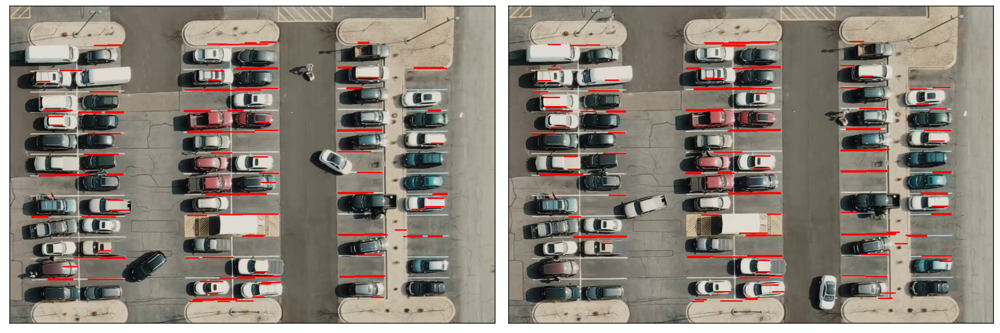

In [80]:
# import operator

def draw_lines(image, lines, color=[255, 0, 0], thickness=2, make_copy=True):
    if make_copy:
        image = np.copy(image) # don't want to modify the original
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 80:
                cleaned.append((x1,y1,x2,y2))
#                 cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    
    cleaned = sorted(cleaned, key=lambda tup: tup[1], reverse=True)
    new_cleaned = []
    for i in range(len(cleaned)-1):
        if abs(cleaned[i+1][1]-cleaned[i][1]) < 30 and abs(cleaned[i+1][0]-cleaned[i][0]) < 30:
            continue
        else:
            new_cleaned.append(cleaned[i+1])

    for i in range(len(new_cleaned)):
        cv2.line(image, (new_cleaned[i][0], new_cleaned[i][1]), (new_cleaned[i][2], new_cleaned[i][3]), color, thickness)
    
#     for i in range(len(cleaned)):
#         cv2.line(image, (cleaned[i][0], cleaned[i][1]), (cleaned[i][2], cleaned[i][3]), color, thickness)
    
    print("Number of lines detected: ", len(new_cleaned))
    return image

line_images = []
for image, lines in zip(test_images, list_of_lines):
    line_images.append(draw_lines(image, lines))
    
display_imgs(line_images)

### Identify rectangular blocks of parking

Number of Parking Lanes:  6


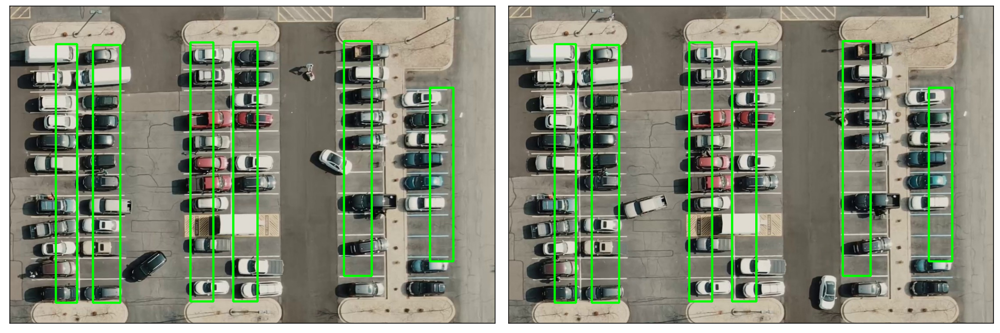

In [127]:
def identify_blocks(image, lines, make_copy=True):
    if make_copy:
        new_image = np.copy(image)
    #Step 1: Create a clean list of lines
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 80:
                cleaned.append((x1,y1,x2,y2))
                
    #Step 2: Sort cleaned by x1 position
    import operator
    list1 = sorted(cleaned, key=operator.itemgetter(0, 1))

    #Step 3: Find clusters of x1 close together - clust_dist apart
    clusters = {}
    dIndex = 0
    clus_dist = 12

    for i in range(len(list1) - 1):
        distance = abs(list1[i+1][0] - list1[i][0])
        if distance <= clus_dist:
            if not dIndex in clusters.keys(): clusters[dIndex] = []
            clusters[dIndex].append(list1[i])
            clusters[dIndex].append(list1[i + 1])

        else:
            dIndex += 1
    
    #Step 4: Identify coordinates of rectangle around this cluster
    rects = {}
    i = 0
    for key in clusters:
        all_list = clusters[key]
        cleaned = list(set(all_list))
        if len(cleaned) > 7:
            cleaned = sorted(cleaned, key=lambda tup: tup[1])
            avg_y1 = cleaned[0][1]
            avg_y2 = cleaned[-1][1]
            avg_x1 = 0
            avg_x2 = 0
            for tup in cleaned:
                avg_x1 += tup[0]
                avg_x2 += tup[2]
            avg_x1 = avg_x1/len(cleaned)
            avg_x2 = avg_x2/len(cleaned)
            rects[i] = (avg_x1, avg_y1, avg_x2, avg_y2)
            i += 1
    return new_image, rects

rect_images = []
rect_coords = []
for image, lines in zip(test_images, list_of_lines):
    new_image, rects = identify_blocks(image, lines)
    rect_images.append(new_image)
    rect_coords.append(rects)

rects = []
rects.extend([rect_coords[1][0], rect_coords[0][1], rect_coords[1][2], rect_coords[0][3], rect_coords[1][5], rect_coords[1][7]])
rects = {i:rects[i] for i in range(len(rects))}

print("Number of Parking Lanes: ", len(rects))
for i in range(len(rects)):
    tup_topLeft = (int(rects[i][0]), int(rects[i][1]))
    tup_botRight = (int(rects[i][2] + 10), int(rects[i][3]))
    cv2.rectangle(rect_images[0], tup_topLeft, tup_botRight, (0,255,0),3)
    cv2.rectangle(rect_images[1], tup_topLeft, tup_botRight, (0,255,0),3)

display_imgs(rect_images)

### Identify each spot and count num of parking spaces

Total parking spaces:  69
Total parking spaces:  69


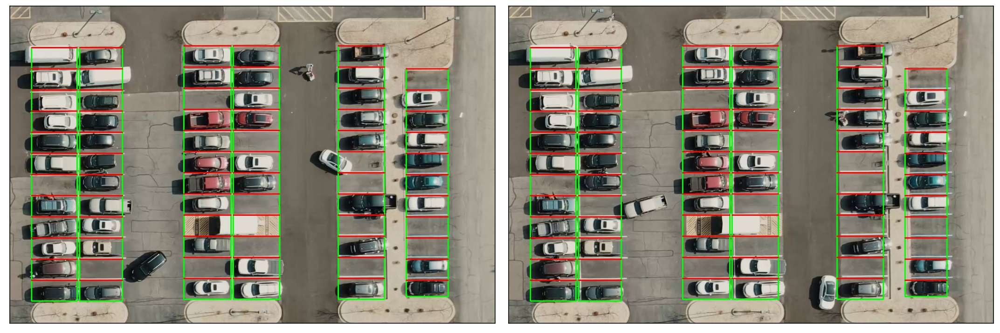

In [128]:
def draw_parking(image, rects, make_copy = True, color=[255, 0, 0], thickness=2, save = True):
    if make_copy:
        new_image = np.copy(image)
    gap = 48
    spot_dict = {} # maps each parking ID to its coords
    adj_x1 = {0: -55, 1:-30, 2:-15, 3:0, 4:-13, 5:-54}
    adj_y1 = {0: 8, 1:6, 2:8, 3:9, 4:11, 5:-43}
    adj_x2 = {0: 10, 1: 15, 2:50, 3:60, 4:39, 5:-2}
    adj_y2 = {0: -4, 1: -4, 2:-5, 3:-5, 4:53, 5:80}
    
    for key in rects:
        # Horizontal lines
        tup = rects[key]
        x1 = int(tup[0] + adj_x1[key])
        x2 = int(tup[2] + adj_x2[key])
        y1 = int(tup[1] + adj_y1[key])
        y2 = int(tup[3] + adj_y2[key])
        cv2.rectangle(new_image, (x1, y1),(x2,y2),(0,255,0),2)
        num_splits = int(abs(y2-y1)//gap)
        for i in range(0, num_splits+1):
            y = int(y1 + i*gap)
            cv2.line(new_image, (x1, y), (x2, y), color, thickness)

        # Dictionary of spot positions
        for i in range(num_splits+1):
            if (key==2 or key==3) and i==8:
                continue
            cur_len = len(spot_dict)
            y = int(y1+i*gap)
            spot_dict[(x1,y,x2,y+gap)] = cur_len + 1
    
    print("Total parking spaces: ", len(spot_dict))
    return new_image, spot_dict

parking_spots = []
spot_pos = []
for image in test_images:
    new_image, spot_dict = draw_parking(image, rects)
    parking_spots.append(new_image)
    spot_pos.append(spot_dict)
    
display_imgs(parking_spots)

In [129]:
final_spot_dict = spot_pos[1]
print(len(final_spot_dict))

69


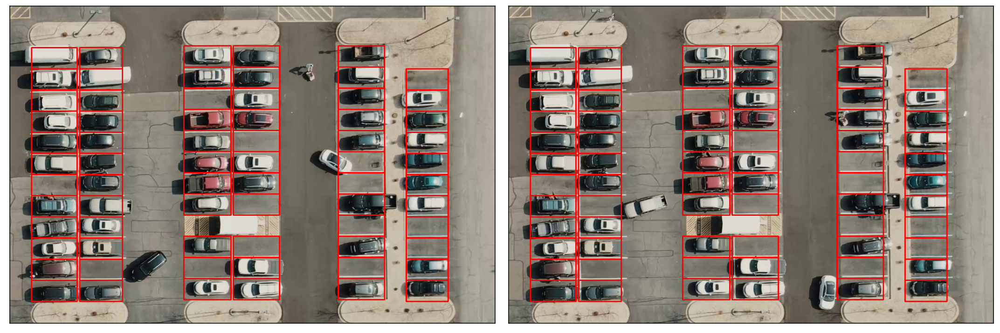

In [131]:
def assign_spots_map(image, spot_dict=final_spot_dict, make_copy = True, color=[255, 0, 0], thickness=2, save=True):
    if make_copy:
        new_image = np.copy(image)
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        cv2.rectangle(new_image, (int(x1),int(y1)), (int(x2),int(y2)), color, thickness)
    if save:
        cv2.imwrite('parking_spots.png', new_image)
    return new_image

marked_spot_images = list(map(assign_spots_map, test_images))
display_imgs(marked_spot_images)

In [132]:
#Saving spot dictionary as pickle file
import pickle

with open('spot_dict.pickle', 'wb') as handle:
    pickle.dump(final_spot_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Save images for CNN model

In [151]:
def save_images_for_cnn(image, spot_dict = final_spot_dict, folder_name ='for_cnn'):
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))
        #crop this image
        spot_img = image[y1:y2, x1:x2]
        spot_img = cv2.resize(spot_img, (0,0), fx=2.0, fy=2.0) 
        spot_id = spot_dict[spot]
        
        filename = 'spot' + str(spot_id) +'.png'
        print(spot_img.shape, filename, (x1,x2,y1,y2))
        cv2.imwrite(os.path.join(folder_name, filename), spot_img)
        
# save_images_for_cnn(test_images[0])

(96, 206, 3) spot1.png (49, 152, 94, 142)
(96, 206, 3) spot2.png (49, 152, 142, 190)
(96, 206, 3) spot3.png (49, 152, 190, 238)
(96, 206, 3) spot4.png (49, 152, 238, 286)
(96, 206, 3) spot5.png (49, 152, 286, 334)
(96, 206, 3) spot6.png (49, 152, 334, 382)
(96, 206, 3) spot7.png (49, 152, 382, 430)
(96, 206, 3) spot8.png (49, 152, 430, 478)
(96, 206, 3) spot9.png (49, 152, 478, 526)
(96, 206, 3) spot10.png (49, 152, 526, 574)
(96, 206, 3) spot11.png (49, 152, 574, 622)
(96, 206, 3) spot12.png (49, 152, 622, 670)
(96, 194, 3) spot13.png (158, 255, 94, 142)
(96, 194, 3) spot14.png (158, 255, 142, 190)
(96, 194, 3) spot15.png (158, 255, 190, 238)
(96, 194, 3) spot16.png (158, 255, 238, 286)
(96, 194, 3) spot17.png (158, 255, 286, 334)
(96, 194, 3) spot18.png (158, 255, 334, 382)
(96, 194, 3) spot19.png (158, 255, 382, 430)
(96, 194, 3) spot20.png (158, 255, 430, 478)
(96, 194, 3) spot21.png (158, 255, 478, 526)
(96, 194, 3) spot22.png (158, 255, 526, 574)
(96, 194, 3) spot23.png (158, 255

## Use trained CNN model to make predictions

In [3]:
## Imports for making predictions`
import pickle
import os
from PIL import Image
from keras.applications.imagenet_utils import preprocess_input
from keras.models import load_model
from keras.preprocessing import image

In [4]:
cwd = os.getcwd()
best_model = 'car1.h5'

class_dictionary = {}
class_dictionary[0] = 'empty'
class_dictionary[1] = 'occupied'

In [5]:
with open("spot_dict.pickle", "rb") as infile:
    new_spot_dict = pickle.load(infile)

model = load_model(best_model)

In [6]:
new_spot_dict

{(49, 94, 152, 142): 1,
 (49, 142, 152, 190): 2,
 (49, 190, 152, 238): 3,
 (49, 238, 152, 286): 4,
 (49, 286, 152, 334): 5,
 (49, 334, 152, 382): 6,
 (49, 382, 152, 430): 7,
 (49, 430, 152, 478): 8,
 (49, 478, 152, 526): 9,
 (49, 526, 152, 574): 10,
 (49, 574, 152, 622): 11,
 (49, 622, 152, 670): 12,
 (158, 94, 255, 142): 13,
 (158, 142, 255, 190): 14,
 (158, 190, 255, 238): 15,
 (158, 238, 255, 286): 16,
 (158, 286, 255, 334): 17,
 (158, 334, 255, 382): 18,
 (158, 382, 255, 430): 19,
 (158, 430, 255, 478): 20,
 (158, 478, 255, 526): 21,
 (158, 526, 255, 574): 22,
 (158, 574, 255, 622): 23,
 (158, 622, 255, 670): 24,
 (394, 90, 501, 138): 25,
 (394, 138, 501, 186): 26,
 (394, 186, 501, 234): 27,
 (394, 234, 501, 282): 28,
 (394, 282, 501, 330): 29,
 (394, 330, 501, 378): 30,
 (394, 378, 501, 426): 31,
 (394, 426, 501, 474): 32,
 (394, 522, 501, 570): 33,
 (394, 570, 501, 618): 34,
 (394, 618, 501, 666): 35,
 (506, 90, 611, 138): 36,
 (506, 138, 611, 186): 37,
 (506, 186, 611, 234): 38,

In [7]:
def make_prediction(image):
    #Rescale image
    img = image/255.

    #Convert to a 4D tensor
    image = np.expand_dims(img, axis=0)

    # make predictions on the preloaded model
    class_predicted = model.predict(image)
    inID = np.argmax(class_predicted[0])
    label = class_dictionary[inID]
    return label

## Run code on Frame

1/1 [==============================] - 0s 103ms/step
{1: 0, 2: 0, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0, 8: 1, 9: 1, 10: 1, 11: 1, 12: 1, 13: 1, 14: 0, 15: 1, 16: 1, 17: 1, 18: 1, 19: 1, 20: 1, 21: 1, 22: 1, 23: 0, 24: 1, 25: 1, 26: 1, 27: 0, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 0, 35: 1, 36: 1, 37: 1, 38: 1, 39: 1, 40: 0, 41: 1, 42: 1, 43: 0, 44: 0, 45: 1, 46: 1, 47: 1, 48: 1, 49: 1, 50: 1, 51: 1, 52: 0, 53: 0, 54: 1, 55: 0, 56: 1, 57: 0, 58: 1, 59: 0, 60: 1, 61: 1, 62: 1, 63: 1, 64: 1, 65: 1, 66: 0, 67: 0, 68: 1, 69: 1}
1/1 [==============================] - 0s 86ms/step
{1: 0, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0, 8: 1, 9: 1, 10: 1, 11: 1, 12: 1, 13: 1, 14: 1, 15: 1, 16: 1, 17: 1, 18: 1, 19: 1, 20: 0, 21: 1, 22: 1, 23: 0, 24: 1, 25: 1, 26: 1, 27: 0, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 0, 35: 1, 36: 1, 37: 1, 38: 1, 39: 1, 40: 0, 41: 1, 42: 1, 43: 0, 44: 0, 45: 1, 46: 1, 47: 1, 48: 1, 49: 1, 50: 1, 51: 1, 52: 0, 53: 0, 54: 1, 55: 0, 56: 1, 57: 0, 58: 1, 59: 0, 60: 1, 61: 1, 6

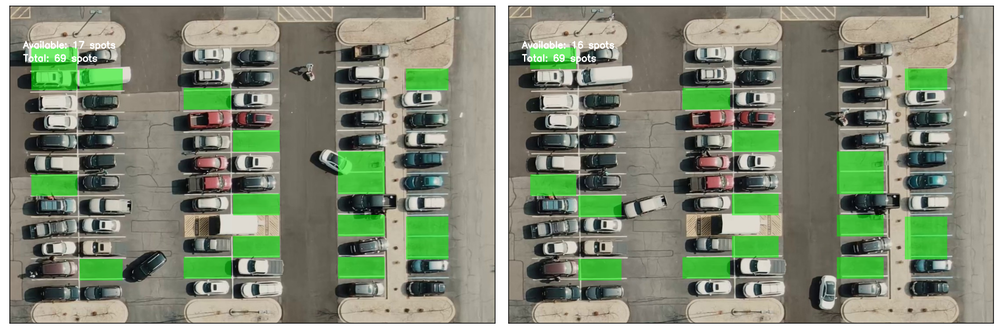

In [14]:
def predict_on_image(image, spot_dict = new_spot_dict, alpha=0.5, save=True):
    new_image = np.copy(image)
    overlay = np.copy(image)
    cnt_empty = 0
    all_spots = len(new_spot_dict)
    pred_dict = {i+1:1 for i in range(len(spot_dict))}
    
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))
        
        #crop this image
        spot_img = image[y1:y2, x1:x2]
        spot_img = cv2.resize(spot_img, (224, 224))
        
        label = make_prediction(spot_img)
        if label == 'empty':
            pred_dict[spot_dict[spot]] = 0
            cv2.rectangle(overlay, (int(x1),int(y1)), (int(x2),int(y2)), [0, 255, 0], -1)
            cnt_empty += 1
    print(pred_dict)
    with open('pred_dict.pickle', 'wb') as handle:
        pickle.dump(pred_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    cv2.addWeighted(overlay, alpha, new_image, 1 - alpha, 0, new_image)
    cv2.putText(new_image, "Available: %d spots" %cnt_empty, (30, 95), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    cv2.putText(new_image, "Total: %d spots" %all_spots, (30, 125), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
     
    if save:
        filename = 'final_predicted.jpg'
        cv2.imwrite(filename, new_image)
    return new_image

predicted_images = list(map(predict_on_image, test_images))
display_imgs(predicted_images)

In [16]:
with open("pred_dict.pickle", "rb") as infile:
    pred_dict = pickle.load(infile)


pred_dict

{1: 0,
 2: 1,
 3: 1,
 4: 1,
 5: 1,
 6: 1,
 7: 0,
 8: 1,
 9: 1,
 10: 1,
 11: 1,
 12: 1,
 13: 1,
 14: 1,
 15: 1,
 16: 1,
 17: 1,
 18: 1,
 19: 1,
 20: 0,
 21: 1,
 22: 1,
 23: 0,
 24: 1,
 25: 1,
 26: 1,
 27: 0,
 28: 1,
 29: 1,
 30: 1,
 31: 1,
 32: 1,
 33: 1,
 34: 0,
 35: 1,
 36: 1,
 37: 1,
 38: 1,
 39: 1,
 40: 0,
 41: 1,
 42: 1,
 43: 0,
 44: 0,
 45: 1,
 46: 1,
 47: 1,
 48: 1,
 49: 1,
 50: 1,
 51: 1,
 52: 0,
 53: 0,
 54: 1,
 55: 0,
 56: 1,
 57: 0,
 58: 1,
 59: 0,
 60: 1,
 61: 1,
 62: 1,
 63: 1,
 64: 1,
 65: 1,
 66: 0,
 67: 0,
 68: 1,
 69: 1}

## Run code on video

In [157]:
cap = cv2.VideoCapture('parking_video.mp4')

ret = True
label = 'occupied'
all_spots = len(new_spot_dict)
frame_counter = 0

while ret:
    ret, image = cap.read()

    new_image = np.copy(image)
    overlay = np.copy(image)
    cnt_empty = 0
    alpha=0.5
    
    for spot in new_spot_dict.keys():
        (x1, y1, x2, y2) = spot
        (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))
        
        #crop this image
        spot_img = image[y1:y2, x1:x2]
        spot_img = cv2.resize(spot_img, (224, 224))

        label = make_prediction(spot_img)
        if label == 'empty':
            cv2.rectangle(overlay, (int(x1),int(y1)), (int(x2),int(y2)), [0, 255, 0], -1)
            cnt_empty += 1

    cv2.addWeighted(overlay, alpha, new_image, 1 - alpha, 0, new_image)
    cv2.putText(new_image, "Available: %d spots" %cnt_empty, (30, 95), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    cv2.putText(new_image, "Total: %d spots" %all_spots, (30, 125), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    
    frame_counter += 1
    if frame_counter == cap.get(cv2.CAP_PROP_FRAME_COUNT):
        frame_counter = 0
        cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    
    cv2.imshow("Output", image)
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()
cap.release()

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 32ms/step
